In [2]:
import datetime
import pandas as pd
import requests
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
import plotly.express as px
%matplotlib inline

mpl.rcParams['figure.figsize'] = (10,8)
mpl.rcParams['axes.grid'] = False

In [3]:

df = pd.read_csv('https://raw.githubusercontent.com/srivatsan88/YouTubeLI/master/dataset/nyc_energy_consumption.csv')

In [4]:
df['timeStamp']= pd.to_datetime(df['timeStamp'])

In [5]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49205 entries, 0 to 49204
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timeStamp  49205 non-null  datetime64[ns]
 1   demand     49124 non-null  float64       
 2   precip     48975 non-null  float64       
 3   temp       49019 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.5 MB


In [6]:

df.head()

,timeStamp,demand,precip,temp
0,2012-01-01 00:00:00,4937.5,0.0,46.13
1,2012-01-01 01:00:00,4752.1,0.0,45.89
2,2012-01-01 02:00:00,4542.6,0.0,45.04
3,2012-01-01 03:00:00,4357.7,0.0,45.03
4,2012-01-01 04:00:00,4275.5,0.0,42.61


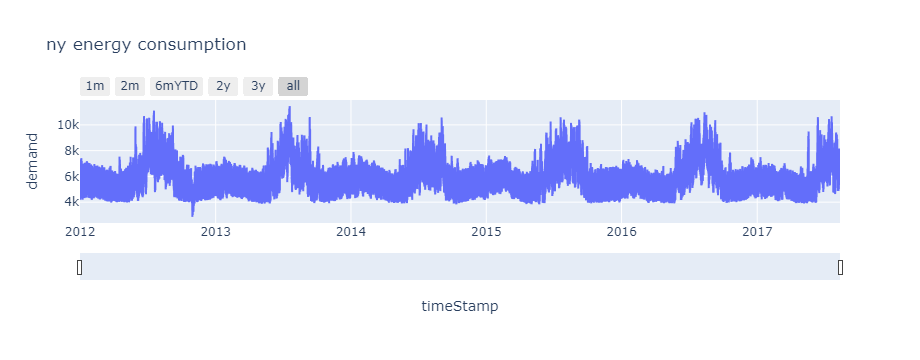

In [7]:
fig = px.line(df, x ='timeStamp', y ='demand', title = 'ny energy consumption')

fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
           dict(count = 1, label = '1m',step='month',stepmode = 'backward'),
           dict(count = 2, label = '2m', step = 'month', stepmode = 'backward'),
           dict(count = 3,label = '6mYTD',step='month',stepmode = "todate"),
           dict(count = 4,label = '2y',step='year',stepmode = "backward"),
           dict(count = 5,label = '3y',step='year',stepmode = "backward"),
           dict(step= 'all')
            
        ])
    )
)

In [8]:

ny_df =df.set_index('timeStamp')
     


In [9]:
ny_df.head(2)

,demand,precip,temp
timeStamp,,,
2012-01-01 00:00:00,4937.5,0.0,46.13
2012-01-01 01:00:00,4752.1,0.0,45.89


array([<Axes: xlabel='timeStamp'>, <Axes: xlabel='timeStamp'>,
       <Axes: xlabel='timeStamp'>], dtype=object)

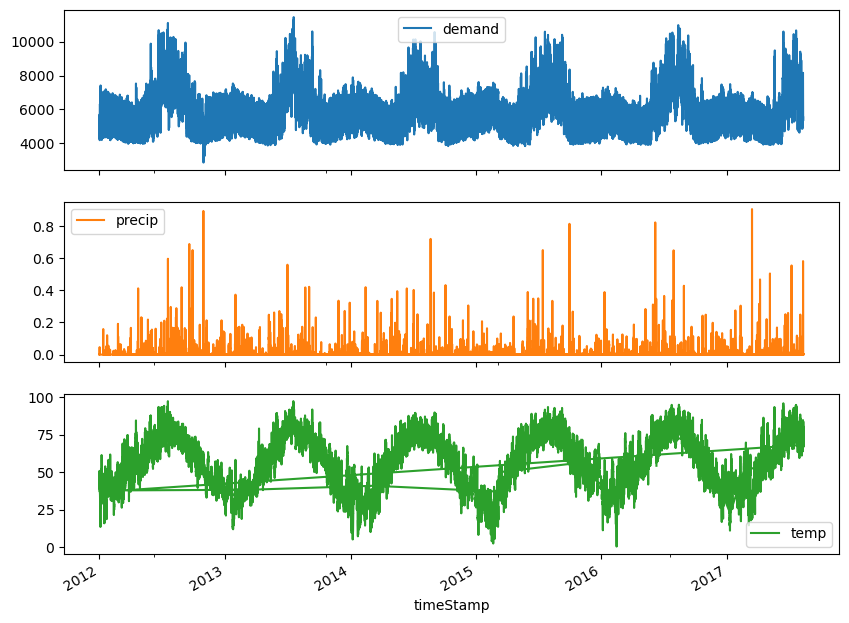

In [10]:

ny_df.plot(subplots = True)

In [11]:
#hourly data

In [12]:
## resampling data at the day level

ny_df.resample('D').mean()

,demand,precip,temp
timeStamp,,,
2012-01-01,4954.833333,0.002487,46.510000
2012-01-02,5302.954167,0.000000,40.496667
2012-01-03,6095.512500,0.000000,26.672500
2012-01-04,6336.266667,0.000000,20.585000
2012-01-05,6130.245833,0.000000,33.577500
...,...,...,...
2017-08-08,6471.626042,0.000000,71.039167
2017-08-09,6811.112167,0.047529,73.852500
2017-08-10,5582.297000,0.002033,75.217500


array([<Axes: xlabel='timeStamp'>, <Axes: xlabel='timeStamp'>,
       <Axes: xlabel='timeStamp'>], dtype=object)

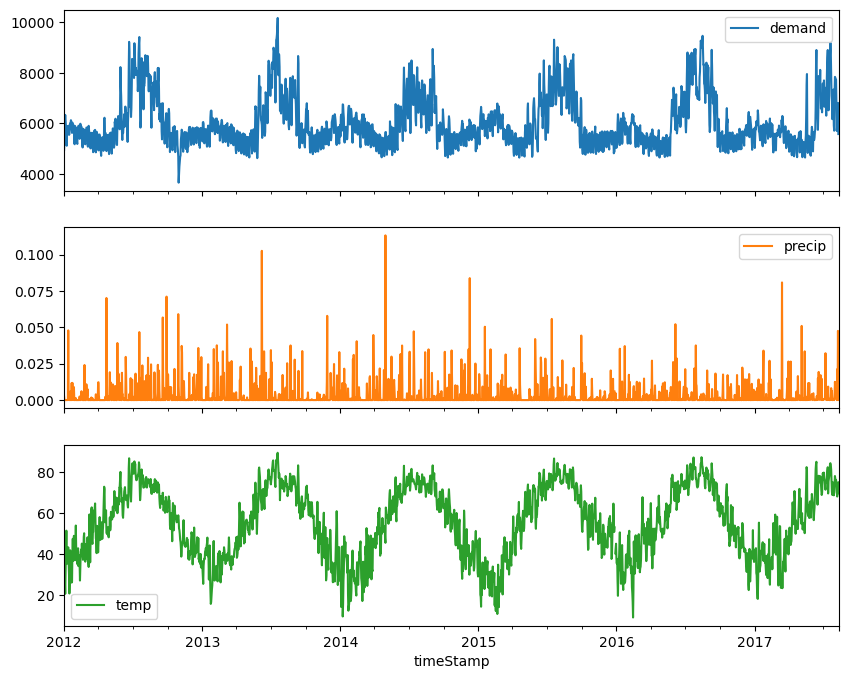

In [13]:
ny_df.resample('D').mean().plot(subplots=True)

In [14]:
ny_df_daily = ny_df.resample('D').mean()
ny_df_daily

,demand,precip,temp
timeStamp,,,
2012-01-01,4954.833333,0.002487,46.510000
2012-01-02,5302.954167,0.000000,40.496667
2012-01-03,6095.512500,0.000000,26.672500
2012-01-04,6336.266667,0.000000,20.585000
2012-01-05,6130.245833,0.000000,33.577500
...,...,...,...
2017-08-08,6471.626042,0.000000,71.039167
2017-08-09,6811.112167,0.047529,73.852500
2017-08-10,5582.297000,0.002033,75.217500


In [15]:
ny_df_daily['demand']= ny_df_daily['demand'].fillna(method = 'ffill')
ny_df_daily['temp']= ny_df_daily['temp'].fillna(method = 'ffill')
ny_df_daily['precip']= ny_df_daily['precip'].fillna(method = 'ffill')

C:\Users\thaku\AppData\Local\Temp\ipykernel_6056\1859844993.py:1: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\thaku\AppData\Local\Temp\ipykernel_6056\1859844993.py:2: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\thaku\AppData\Local\Temp\ipykernel_6056\1859844993.py:3: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [19]:
from prophet import Prophet

In [20]:
ny_df_daily.columns

Index(['demand', 'precip', 'temp'], dtype='object')

In [21]:
ny_df_final = ny_df_daily.reset_index()[['timeStamp','demand']].rename({'timeStamp':'ds','demand':'y'}, axis=1)
     

In [22]:
ny_df_final.head()
# prophet can use internalized algos to do fill na 

,ds,y
0,2012-01-01,4954.833333
1,2012-01-02,5302.954167
2,2012-01-03,6095.512500
3,2012-01-04,6336.266667
4,2012-01-05,6130.245833


In [23]:

def printStats(dataframe):
  print("Rows     :", dataframe.shape[0])
  print("Columns  :", dataframe.shape[1])
  print("\n Features \n", dataframe.columns.to_list())
  print("\n Missing Values \n", dataframe.isnull().any())
  print("\n Unique Values \n", dataframe.nunique())

In [24]:
printStats(ny_df_final)

Rows     : 2051
Columns  : 2

 Features 
 ['ds', 'y']

 Missing Values 
 ds    False
y     False
dtype: bool

 Unique Values 
 ds    2051
y     2047
dtype: int64


In [25]:
ny_df_final.head()

,ds,y
0,2012-01-01,4954.833333
1,2012-01-02,5302.954167
2,2012-01-03,6095.512500
3,2012-01-04,6336.266667
4,2012-01-05,6130.245833


In [26]:
train = ny_df_final[(ny_df_final['ds']>='2012-01-01') & (ny_df_final['ds']<='2017-04-30')]
test = ny_df_final[(ny_df_final['ds']>'2017-04-30')]

In [27]:
train.shape

(1947, 2)

In [28]:
test.shape

(104, 2)

In [31]:
m = Prophet(interval_width = 0.95, yearly_seasonality = True)
# by defaut results are given with 80 percent CI
## it can detect the seasonality internally also but since we know already so specifying here


In [32]:
m.fit(train)

02:03:22 - cmdstanpy - INFO - Chain [1] start processing
02:03:22 - cmdstanpy - INFO - Chain [1] done processing


In [33]:

m.params
     

OrderedDict([('lp__', array([[5008.93]])),
             ('k', array([[0.0719864]])),
             ('m', array([[0.594485]])),
             ('delta',
              array([[-2.41958e-08, -1.02196e-02, -6.99955e-02, -4.08400e-05,
                      -7.41319e-08, -1.47573e-07, -4.40613e-08,  7.84079e-08,
                      -5.91069e-08, -1.21690e-07, -4.58484e-02, -5.09678e-02,
                      -4.11113e-08,  1.61811e-06,  1.83664e-01,  4.77067e-02,
                      -6.37164e-08, -7.34837e-02, -6.62132e-02,  1.39346e-07,
                       2.32319e-07, -3.16977e-08,  1.56664e-02,  2.18398e-03,
                       5.42049e-08]])),
             ('sigma_obs', array([[0.0460283]])),
             ('beta',
              array([[-0.03473   , -0.0704778 ,  0.0575821 ,  0.0470505 , -0.0140608 ,
                      -0.0049974 , -0.00388817, -0.00073205,  0.00240753, -0.00756529,
                       0.00404114,  0.00482936, -0.00790341, -0.00470648,  0.00701066,
          

In [34]:
future = m.make_future_dataframe(periods = 104)

In [35]:
future.tail()

,ds
2046,2017-08-08
2047,2017-08-09
2048,2017-08-10
2049,2017-08-11
2050,2017-08-12


In [36]:
forecast = m.predict(future)

In [37]:
forecast[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2046,2017-08-08,7590.052252,6746.002508,8505.847420
2047,2017-08-09,7579.218175,6718.293033,8483.769254
2048,2017-08-10,7533.989360,6631.860760,8446.568357
2049,2017-08-11,7489.261111,6594.188781,8422.788779
2050,2017-08-12,6914.501265,6008.214537,7813.459369


<Axes: xlabel='ds'>

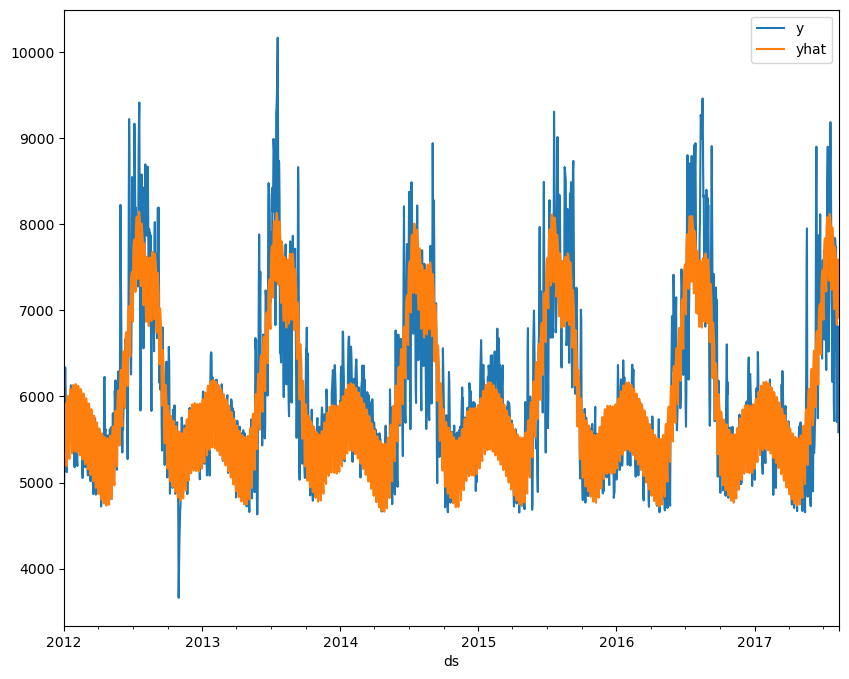

In [39]:
pd.concat([ny_df_final.set_index('ds'), forecast.set_index('ds')['yhat']], axis =1).plot()

In [40]:
pd.concat([ny_df_final.set_index('ds')['y'],forecast.set_index('ds')['yhat']],axis=1).head(20)

,y,yhat
ds,,
2012-01-01,4954.833333,5112.187570
2012-01-02,5302.954167,5796.552806
2012-01-03,6095.512500,5913.567178
2012-01-04,6336.266667,5921.210978
2012-01-05,6130.245833,5891.794448
2012-01-06,5867.537500,5860.277444
2012-01-07,5177.441667,5296.253107
2012-01-08,5120.541667,5189.638894
2012-01-09,5890.820833,5877.029285


C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



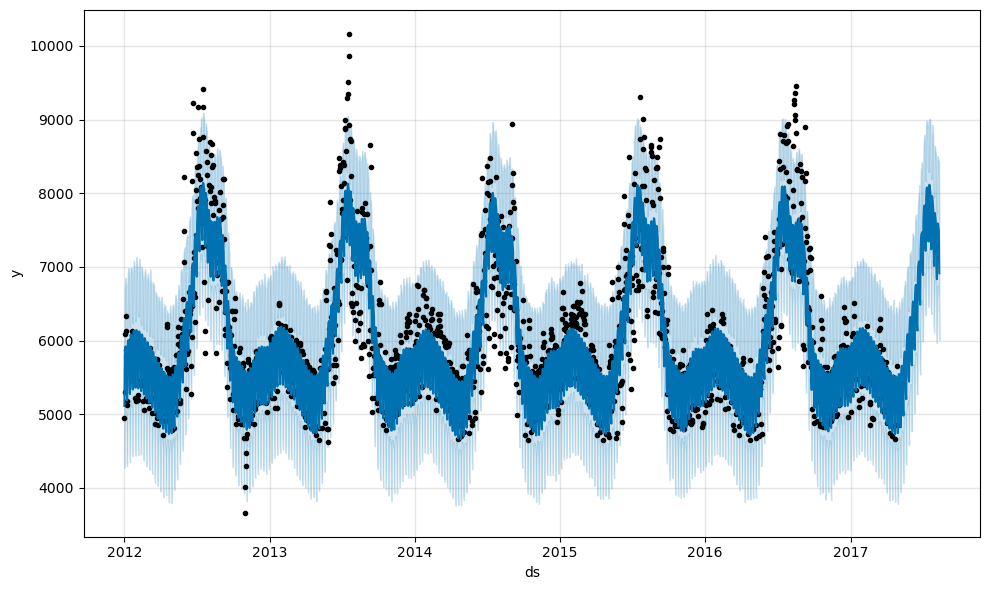

In [41]:
fig1 = m.plot(forecast)
#95% Confidence interval is the light blue color
#the black dots are actual values 
#the dark blue is the y_hat or forecasted value

C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



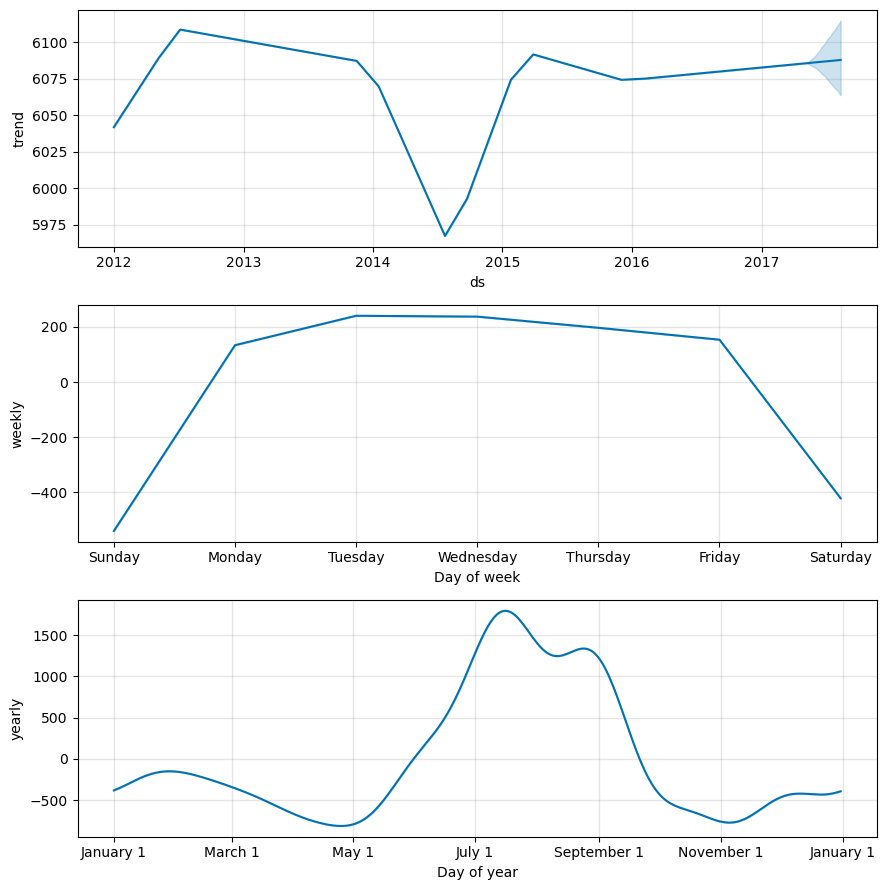

In [42]:

fig2 = m.plot_components(forecast)

C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



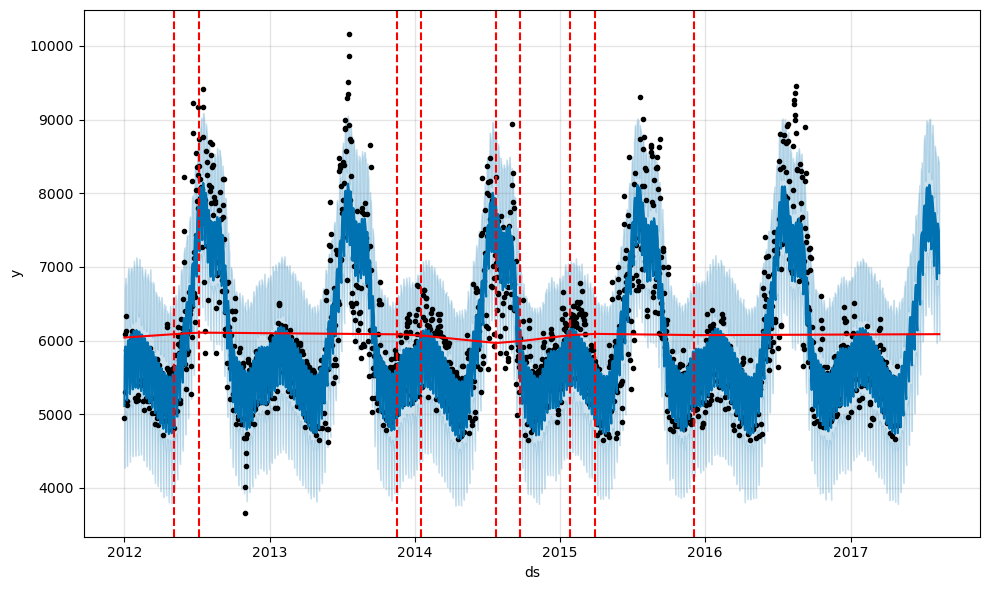

In [44]:
## changfepoints are the points where change in the trend occurs
from prophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m , forecast)

In [53]:
deltas = m.params['delta'][0]

In [55]:
range(len(deltas))

range(0, 25)

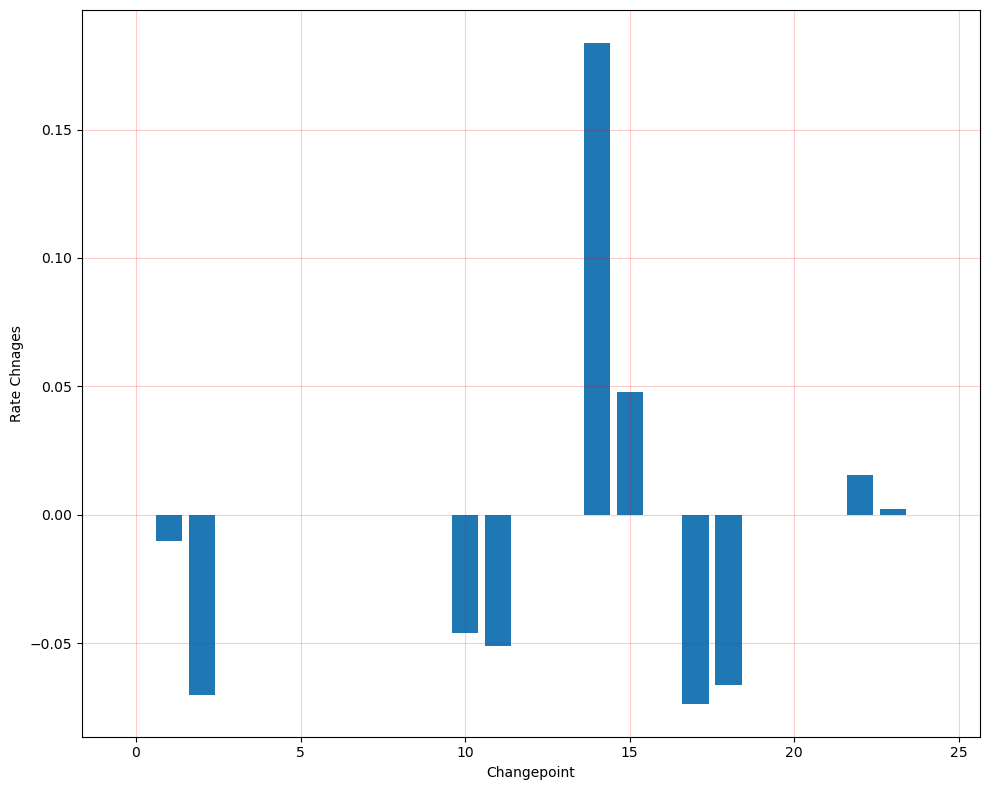

In [56]:
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111)
ax.bar(range(len(deltas)),deltas)
ax.grid(True,which='major',c='red',ls='-',alpha=0.2)
ax.set_ylabel('Rate Chnages')
ax.set_xlabel('Changepoint')
fig.tight_layout()

In [57]:
## shows the changepoints and their effect , deltas show the effect in a way ,the values
## most values are very small so not visible

In [58]:

m.changepoints

62     2012-03-03
124    2012-05-04
187    2012-07-06
249    2012-09-06
311    2012-11-07
373    2013-01-08
436    2013-03-12
498    2013-05-13
560    2013-07-14
622    2013-09-14
685    2013-11-16
747    2014-01-17
809    2014-03-20
871    2014-05-21
934    2014-07-23
996    2014-09-23
1058   2014-11-24
1120   2015-01-25
1183   2015-03-29
1245   2015-05-30
1307   2015-07-31
1369   2015-10-01
1432   2015-12-03
1494   2016-02-03
1556   2016-04-05
Name: ds, dtype: datetime64[ns]

02:17:14 - cmdstanpy - INFO - Chain [1] start processing
02:17:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\thaku\anaconda3\lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



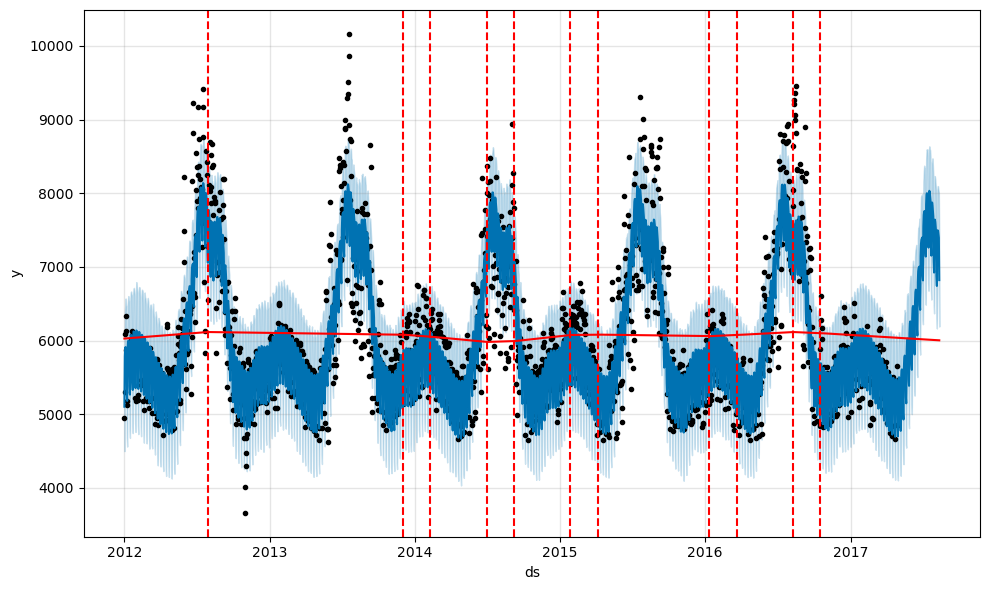

In [60]:
pro_change = Prophet(changepoint_range=0.9,yearly_seasonality=True)
forecast = pro_change.fit(train).predict(future)
fig = pro_change.plot(forecast)
a = add_changepoints_to_plot(fig.gca(),pro_change,forecast)
## by default 80 percent of values are used to detect changepoints but here we can specify the changepoint range
## which would tell that use 90 percent of historic data for changepoint detection

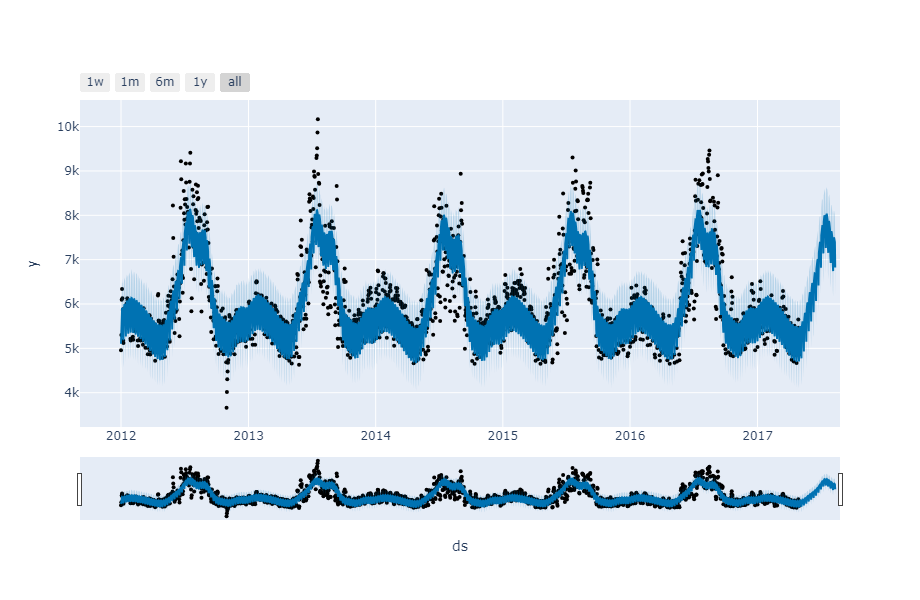

In [62]:
from prophet.plot import plot_plotly
import plotly.offline as py
fig = plot_plotly(m, forecast)
py.iplot(fig)

In [64]:
from prophet.diagnostics import cross_validation
cv_results = cross_validation(model = m, initial = '731 days', horizon = '365 days')
## uses first 731 days to train 
## then out of 365 uses 180 to validation and 180 to test 
## 5 because 180*4 = 720 , rest in 5th to give 731

  0%|          | 0/5 [00:00<?, ?it/s]

02:24:43 - cmdstanpy - INFO - Chain [1] start processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] start processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] start processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] start processing
02:24:44 - cmdstanpy - INFO - Chain [1] done processing
02:24:44 - cmdstanpy - INFO - Chain [1] start processing
02:24:44 - cmdstanpy - INFO - Chain [1] done processing


In [65]:

cv_results.head(5)

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2014-05-02,5568.367297,4762.672808,6331.832829,5460.325000,2014-05-01
1,2014-05-03,4978.611000,4143.075941,5862.984452,4893.683333,2014-05-01
2,2014-05-04,4854.953146,3994.513275,5733.064481,4764.137500,2014-05-01
3,2014-05-05,5536.088256,4746.972463,6325.474013,5406.762500,2014-05-01
4,2014-05-06,5631.246867,4834.355678,6494.464547,5409.750000,2014-05-01


In [66]:
from prophet.diagnostics import performance_metrics

In [67]:
df_p = performance_metrics(cv_results)

In [68]:
df_p

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days 12:00:00,252711.699408,502.704386,406.650703,0.073090,0.065493,0.072117,0.890110
1,37 days 00:00:00,259467.857078,509.379875,414.094923,0.074384,0.066294,0.073328,0.884615
2,37 days 12:00:00,261748.756692,511.613875,417.416085,0.074956,0.066533,0.073928,0.884615
3,38 days 00:00:00,264546.887838,514.341217,420.446939,0.075206,0.066837,0.074153,0.884615
4,38 days 12:00:00,268211.625778,517.891519,425.611043,0.076029,0.067178,0.075003,0.884615
...,...,...,...,...,...,...,...,...
653,363 days 00:00:00,261876.002377,511.738217,450.177120,0.083096,0.082132,0.082195,0.983516
654,363 days 12:00:00,263509.941990,513.332195,451.091448,0.083258,0.082132,0.082454,0.983516
655,364 days 00:00:00,267999.996366,517.687161,454.720672,0.084115,0.084492,0.083315,0.983516
656,364 days 12:00:00,267989.498943,517.677022,454.262253,0.084068,0.084492,0.083353,0.983516
